# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "simulation_cluster_imbalancep2"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Jul27-1321'

In [14]:
concord_methods = ['concord_hcl', 'concord_knn']
other_methods = [
    'contrastive',
        "unintegrated",
        "scanorama", "liger", "harmony",
        "scvi", 
]
run_methods = concord_methods + other_methods
# exclude ["UMAP", "t-SNE"] from run_method, and save as combined_keys
exclude_keys = ["PCA", "UMAP", "t-SNE"]
combined_keys = ['no_noise', 'wt_noise'] + [key for key in run_methods if key not in exclude_keys]

In [5]:
state_key = 'cluster'
batch_key = 'batch'
state_type = 'cluster'
leiden_key='leiden'
BATCH_TYPE = 'batch_specific_features'
DISTRIBUTION = 'normal'

In [ ]:
from pathlib import Path
from concord.simulation import LevelSpec, simulate_imbalanced_datasets
adata_dict = simulate_imbalanced_datasets(
    total_cells=4000,
    total_genes=2000,
    n_clusters=8,
    batch_feature_frac=0.02,
    mean_level=10.0,
    state_dispersion=10.0,
    batch_dispersion=10.0,
    levels = [
            LevelSpec( 2, 5.0, 0.3),
            LevelSpec(10, 1.0, 0.8),
            LevelSpec(30, 0.5, 0.8),
    ],
    pair_prob = 0.0,
    seed=seed
)

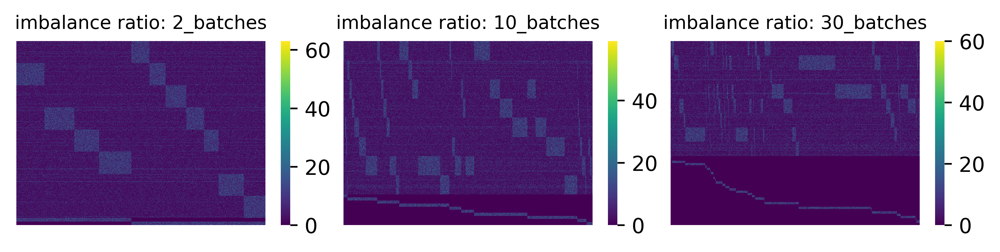

In [247]:
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = len(adata_dict)
title_fontsize = 9
dpi = 600
fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
for i, (ratio, adata) in enumerate(adata_dict.items()):
    _, _, state_pal = ccd.pl.get_color_mapping(adata, state_key, pal='Paired', seed=seed)
    _, _, batch_pal = ccd.pl.get_color_mapping(adata, batch_key, pal='Set1', seed=seed)
    pal = {state_key: state_pal, batch_key: batch_pal}
    ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], pal=pal, ax = axes[i], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title=f"imbalance ratio: {ratio}", save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
plt.tight_layout(w_pad=0.0, h_pad=0.1)
plt.savefig(save_dir / f"data_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

### Integration pipeline

In [ ]:
run_methods = concord_methods + other_methods
latent_dim = 30

In [ ]:
concord_kwargs = {
    'batch_size': 128,
    'n_epochs': 15,
    'load_data_into_memory': True,
    'verbose': False,
}
for i, (ratio, adata) in enumerate(adata_dict.items()):
    #domain_coverage = ccd.ul.calculate_domain_coverage_by_cluster(adata, domain_key=batch_key, cluster_key=state_key)
    #print(f"Domain coverage for ratio {ratio}: {domain_coverage}")
    #concord_kwargs['domain_coverage'] = domain_coverage
    print(f"Processing imbalance ratio: {ratio}")
    ccd.ul.run_pca(adata, source_key='no_noise', result_key='PCA_no_noise', n_pc=latent_dim, random_state=seed)
    ccd.ul.run_pca(adata, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=latent_dim, random_state=seed)
    # Put the PCA result in the adata object, so only one object is needed
    adata.obsm['no_noise'] = adata.obsm['PCA_no_noise']
    adata.obsm['wt_noise'] = adata.obsm['PCA_wt_noise']
    # sc.pp.pca(adata, n_comps=latent_dim, random_state=seed)

    profile_logs = ccd.bm.run_integration_methods_pipeline(
        adata=adata,                          
        methods=run_methods,            # List of methods to run
        batch_key=batch_key,                    # Column in adata.obs for batch info
        count_layer="counts",                 # Layer name containing raw counts
        class_key=state_key,               # Column in adata.obs for class labels (used in SCANVI and CONCORD variants)
        latent_dim=latent_dim,                        # Latent dimensionality for PCA and embeddings
        device="cpu",                        # Or "cpu", or "mps" for Apple Silicon
        return_corrected=False,                   # Whether to store corrected expression matrices
        transform_batch=None,                 # Optionally specify a batch to transform to in scVI
        seed=seed,                              # Random seed for reproducibility
        compute_umap=False,                        # Run UMAP for all output embeddings
        umap_n_components=2,
        umap_n_neighbors=30,
        umap_min_dist=0.5,
        verbose=True,                        # Print progress messages
        save_dir=save_dir,
        concord_kwargs=concord_kwargs,
    )


Processing imbalance ratio: 2_batches
concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
concord - WARNING - FAISS not found. Using sklearn for k-NN computation.
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_knn: 5.40s | 0.47 MB RAM | 0.00 MB VRAM


concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_hcl: 5.74s | 11.34 MB RAM | 0.00 MB VRAM
✅ All selected methods completed.


Processing imbalance ratio: 10_batches
concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
concord - WARNING - FAISS not found. Using sklearn for k-NN computation.
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_knn: 5.11s | 0.00 MB RAM | 0.00 MB VRAM


concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_hcl: 5.57s | 0.00 MB RAM | 0.00 MB VRAM
✅ All selected methods completed.


Processing imbalance ratio: 30_batches
concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
concord - WARNING - FAISS not found. Using sklearn for k-NN computation.
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_knn: 6.90s | 5.00 MB RAM | 0.00 MB VRAM


concord - WARNING - save_dir is None. Model and log files will not be saved.
concord - WARNING - Input data in adata.X appears to be raw counts. CONCORD performs best on normalized and log-transformed data. Consider setting normalize_total=True and log1p=True.
concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Epoch 0 Training
Epoch 1 Training
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training
concord - WARNING - save_dir is None. Skipping model/config saving.


concord_hcl: 6.50s | 0.89 MB RAM | 0.00 MB VRAM
✅ All selected methods completed.


In [ ]:
for i, (ratio, adata) in enumerate(adata_dict.items()):
    print(f"Processing imbalance ratio: {ratio}")
    for basis in combined_keys:
        print("Running UMAP for", basis)
        if f'{basis}_UMAP' not in adata.obsm.keys():
            try:
                ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.3, metric='euclidean', random_state=seed)
            except Exception as e:
                print(f"Error running UMAP for {basis}: {e}")
                continue

Processing imbalance ratio: 2_batches


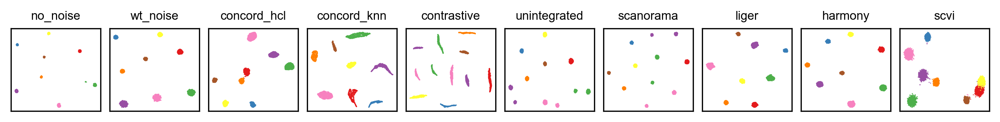

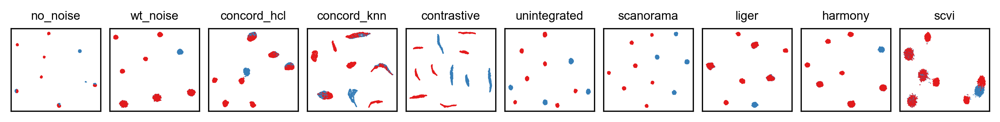

Processing imbalance ratio: 10_batches


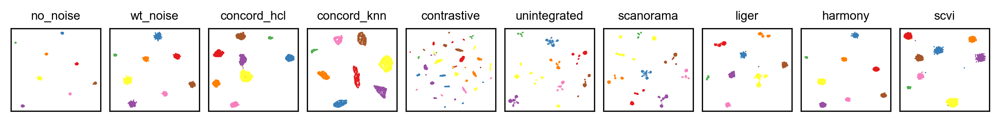

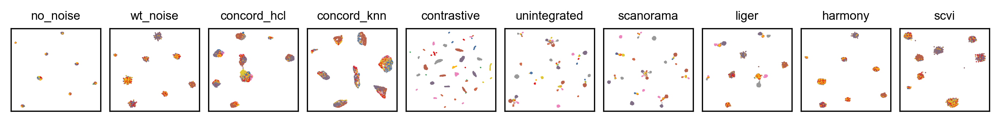

Processing imbalance ratio: 30_batches


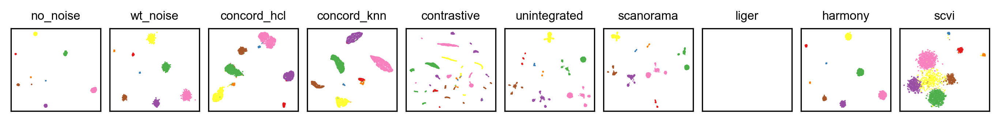

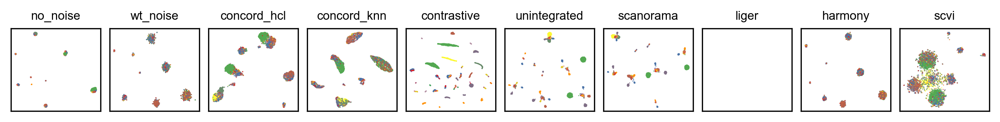

In [246]:
# plot everything
import matplotlib.pyplot as plt

show_keys = combined_keys
# check which methods are run successfully
color_bys = [state_key, batch_key]
basis_types = ['UMAP']
#basis_types = ['KNN']
font_size=8
point_size=2
alpha=0.8
figsize=(0.9*len(show_keys),1)
ncols = len(show_keys)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'time':'viridis', 'batch':'Set1'}
k=15
edges_color='grey'
edges_width=0
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

rasterized = True

for i, (ratio, adata) in enumerate(adata_dict.items()):
    print(f"Processing imbalance ratio: {ratio}")

    with plt.rc_context(rc=custom_rc):
        ccd.pl.plot_all_embeddings(
            adata,
            show_keys,
            color_bys=color_bys,
            basis_types=basis_types,
            pal=pal,
            k=k,
            edges_color=edges_color,
            edges_width=edges_width,
            layout=layout,
            threshold=threshold,
            node_size_scale=node_size_scale,
            edge_width_scale=edge_width_scale,
            font_size=font_size,
            point_size=point_size,
            alpha=alpha,
            rasterized=rasterized,
            figsize=figsize,
            ncols=ncols,
            seed=seed,
            leiden_key='leiden',
            save_dir=save_dir,
            file_suffix=file_suffix+ f"_{ratio}",
            save_format='svg'
        )


In [ ]:
# Save adata_dict to file
import pickle
with open(save_dir / f"adata_dict_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(adata_dict, f)  

print(f"Saved adata_dict to {save_dir / f'adata_dict_{file_suffix}.pkl'}")

Processing imbalance ratio: 2_batches, adata shape: (3795, 2080)
Processing imbalance ratio: 10_batches, adata shape: (3999, 2400)
Processing imbalance ratio: 30_batches, adata shape: (3948, 3200)


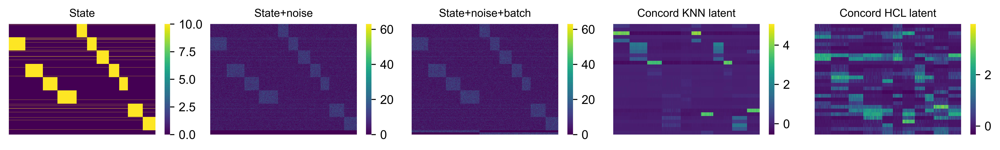

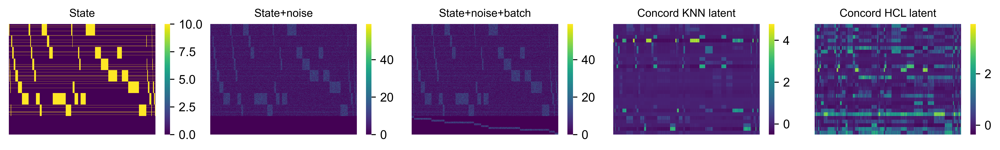

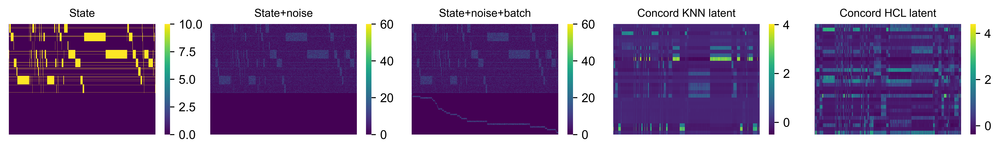

In [249]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
for i, (ratio, adata) in enumerate(adata_dict.items()):
    print(f"Processing imbalance ratio: {ratio}, adata shape: {adata.shape}")
    batch_id=adata.obs['batch'].unique()[0]
    batch_indices = np.where(adata.obs['batch'] == batch_id)[0]
    _, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='concord_knn', path=batch_indices, sigma=2)
    adata.obsm['concord_knn_sorted'] = adata.obsm['concord_knn'][:, feature_order]
    _, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='concord_hcl', path=batch_indices, sigma=2)
    adata.obsm['concord_hcl_sorted'] = adata.obsm['concord_hcl'][:, feature_order]
    # Run concord latent
    _, _, state_pal = ccd.pl.get_color_mapping(adata, state_key, pal='Paired', seed=seed)
    _, _, batch_pal = ccd.pl.get_color_mapping(adata, batch_key, pal='Set1', seed=seed)
    pal = {state_key: state_pal, batch_key: batch_pal}
    dpi = 600
    with plt.rc_context(rc=custom_rc):
        fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
        ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, pal=pal, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
        ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, pal=pal, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
        ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, pal=pal, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
        ccd.pl.heatmap_with_annotations(adata, val='concord_knn_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, pal=pal, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord KNN latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
        ccd.pl.heatmap_with_annotations(adata, val='concord_hcl_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, pal=pal, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord HCL latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
        plt.tight_layout(w_pad=0.0, h_pad=0.1)
        plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

# Evaluation

In [245]:
# Load adata_dict from file
import pickle
with open(Path('../save/dev_simulation_cluster_imbalancep2-Jul27/adata_dict_Jul27-1321.pkl'), 'rb') as f:
    adata_dict = pickle.load(f) 

In [ ]:
bm_results = {}
for i, (ratio, adata) in enumerate(adata_dict.items()):
    print(f"Processing imbalance ratio: {ratio}")
    # if i == 2:
    #     # remove 'liger' from combined_keys
    #     use_keys = [key for key in combined_keys if key != 'liger']
    # else:
    #     use_keys = combined_keys  # Use all keys for other ratios
    out = ccd.bm.run_benchmark_pipeline(
        adata,
        embedding_keys=use_keys,
        state_key=state_key,
        batch_key=batch_key,
        groundtruth_key="no_noise",  # use the Leiden clusters as ground truth
        save_dir=save_dir / "benchmarks_out",
        file_suffix=file_suffix,  # e.g. "2025-06-25"
        run=("scib", "probe", "geometry", "topology"),          # run only these blocks
        plot_individual=False,          # skip the intermediate PDFs
        expected_betti_numbers=[7,0,0],  # expected Betti numbers for the geometry and topology blocks
        max_points=1000,
        seed=seed,  # for reproducibility
    )
    bm_results[ratio] = out  # Store the results for this imbalance ratio
    combined = out["combined"]

In [161]:
# Save benchmark results
import pickle
with open(save_dir / f"benchmark_results_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(bm_results, f)

print(f"Saved benchmark results to {save_dir / f'benchmark_results_{file_suffix}.pkl'}")

Saved benchmark results to ../save/dev_simulation_cluster_imbalancep2-Jul27/benchmark_results_Jul27-1321.pkl


In [252]:
combined_df

Batch correction                                     \
             Graph connectivity     iLISI      KBET PCR comparison   
no_noise                0.80898  0.089226  0.807827       0.089072   
concord_knn            0.964659  0.051305  0.777177       0.370543   
harmony                0.795348  0.057694  0.937049       0.298758   
scvi                   0.720572  0.079938  0.901739       0.922439   
unintegrated           0.781626  0.000152  0.324623              0   
concord_hcl            0.972576  0.030988  0.655634       0.199396   
scanorama              0.917494  0.000826  0.323904              0   
wt_noise               0.711136   0.05796  0.952645       0.370856   
contrastive            0.455273       0.0  0.330621              0   

                              Bio conservation                             \
             Silhouette batch            cLISI Isolated labels Leiden ARI   
no_noise             0.992603              1.0             1.0   0.996909   
concord_knn            0.7271              1.0        0.631684   0.982639   
harmony              0.856243              1.0        0.820175        1.0   
scvi                  0.83718         0.993375        0.687153   0.882429   
unintegrated         0.798118              1.0        0.768261   0.704922   
concord_hcl           0.81765              1.0        0.781564   0.976898   
scanorama            0.832575              1.0        0.729651   0.726355   
wt_noise             0.879151              1.0        0.787741   0.994951   
contrastive          0.328271              1.0        0.738818   0.443691   

                                          ...                        \
             Leiden NMI Silhouette label  ... Linear state accuracy   
no_noise        0.99389              1.0  ...              1.000000   
concord_knn     0.96662          0.85274  ...              0.965779   
harmony             1.0         0.767851  ...              1.000000   
scvi           0.863538         0.516981  ...              0.922687   
unintegrated   0.876788         0.712492  ...              1.000000   
concord_hcl     0.95442         0.663685  ...              0.973384   
scanorama      0.889807         0.705012  ...              0.617237   
wt_noise       0.992981         0.741053  ...              0.998733   
contrastive    0.691697         0.611361  ...              0.980989   

                              Geometry                              Topology  \
             Cell distance correlation Trustworthiness Betti curve stability   
no_noise                           NaN             NaN              0.077591   
concord_knn                   0.932203        0.906601              0.441288   
harmony                       0.971112        0.908775              0.425785   
scvi                          0.581221        0.843312              0.394026   
unintegrated                  0.930082        0.909970              0.308244   
concord_hcl                   0.595993        0.898844              0.190217   
scanorama                     0.935228        0.912427              0.217536   
wt_noise                           NaN             NaN              0.420440   
contrastive                   0.591789        0.896656              0.343873   

                                    Aggregate score                   \
             Betti number accuracy Batch correction Bio conservation   
no_noise                  1.000000         0.557541         0.998686   
concord_knn               0.250000         0.578157         0.913124   
harmony                   0.166667         0.589018         0.941146   
scvi                      0.200000         0.692374         0.829344   
unintegrated              0.166667         0.380904         0.866066   
concord_hcl               0.125000         0.535249         0.905870   
scanorama                 0.125000         0.414960         0.809723   
wt_noise                  0.001099         0.594350         0.930780   
contrastive  

Imbalance ratio: 2_batches


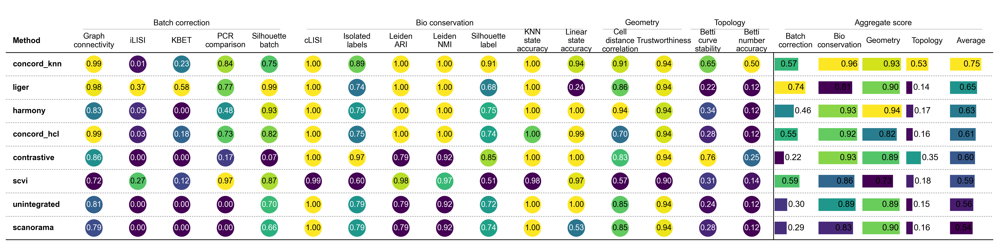

Imbalance ratio: 10_batches


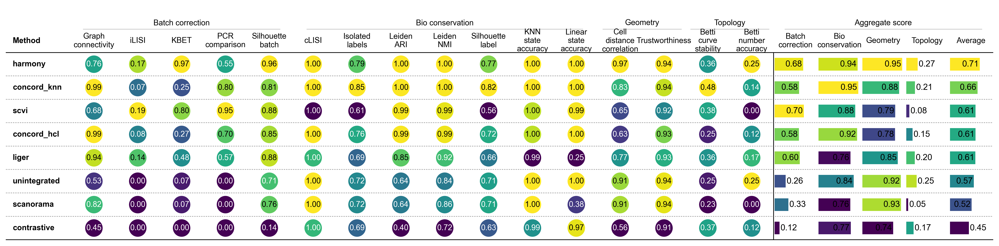

Imbalance ratio: 30_batches


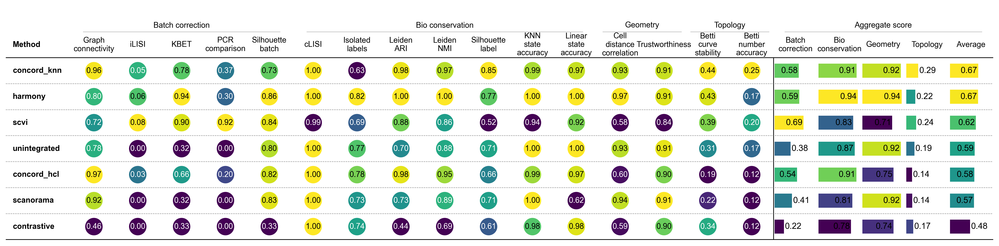

In [ ]:
# Load benchmark results
import pickle
bm_results = pickle.load(open(Path('../save/dev_simulation_cluster_imbalancep2-Jul27/benchmark_results_Jul27-1321.pkl'), "rb"))
for ratio, out in bm_results.items():
    print(f"Imbalance ratio: {ratio}")
    table_plot_kw = dict(
            pal="viridis", pal_agg="viridis", cmap_method="minmax", dpi=300)
    with plt.rc_context(rc=custom_rc):
        combined_df = ccd.bm.combine_benchmark_results(
            out,
            block_include=("geometry", 'topology', "scib", "probe"),
            plot=False,
            save_path=save_dir / f"combined_res_{file_suffix}.pdf",
            table_plot_kw=table_plot_kw,
        )
        
        ccd.bm.plot_benchmark_table(
                combined_df.dropna(axis=0, how='any'),
                save_path=save_dir / f"benchmark_table_{file_suffix}.svg",
                agg_name="Aggregate score",
                figsize=(25, 6),
                **table_plot_kw
                )